# **Classifying the ACM Grand-Challenge DeepFake Videos with Gemini 2.0 Flash**
### This will serve as baseline for comparison in the report, this is because this refer to using a proprietary model, not open-source one, but it will be good to know the limits of how much a big model like this one can right out-of-the-box be able to correctly classify these type of audio-visual data.
### The subsets of data used were obtained from:
### https://huggingface.co/datasets/ControlNet/AV-Deepfake1M-PlusPlus

In [ ]:
from google.colab import drive
drive.mount('/content/drive') # The videos are contained in my personal drive

Mounted at /content/drive


## Counting the videos use for the classification

In [ ]:
import os

def count_videos_in_nested_folders(start_path):
    """
    Counts video files within a specified directory and its subfolders.

    Args:
        start_path (str): The root directory to start scanning from.

    Returns:
        int: The total count of video files found.
    """
    if not os.path.exists(start_path):
        print(f"Error: The path '{start_path}' does not exist.")
        return 0
    if not os.path.isdir(start_path):
        print(f"Error: The path '{start_path}' is not a directory.")
        return 0

    # Define common video file extensions (case-insensitive)
    video_extensions = ('.mp4', '.avi', '.mov', '.mkv', '.flv', '.webm', '.wmv',
                        '.mpeg', '.mpg', '.3gp', '.vob', '.ogv', '.mts', '.m2ts')

    video_count = 0
    print(f"Scanning '{start_path}' for video files...")

    # root: current directory
    # dirs: subdirectories in root
    # files: non-directory files in root
    for root, dirs, files in os.walk(start_path):
        for file_name in files:
            # Get the file extension and convert to lowercase for case-insensitive comparison
            _, ext = os.path.splitext(file_name)
            if ext.lower() in video_extensions:
                video_count += 1
                # Optional: Uncomment the line below to print the path of each found video
                # print(f"  Found: {os.path.join(root, file_name)}")

    return video_count

In [ ]:
# This refers to counting all the videos downloaded from the repository
#in hugging face for the challenge

base_video_path = "/content/drive/MyDrive/DeepFake_Detection_Videos"

total_videos = count_videos_in_nested_folders(base_video_path)

if total_videos > 0:
   print(f"\n--- Scan Complete ---")
   print(f"Total videos found: {total_videos}")
elif total_videos == 0:
   print("\nNo video files found in the specified directory or its subfolders.")

Scanning '/content/drive/MyDrive/DeepFake_Detection_Videos' for video files...

--- Scan Complete ---
Total videos found: 3247


In [ ]:
# Training videos from hugging face, in this case they were not used,
# there were only 4 of them used as one-shot examples of what the data entails for classification
# train videos obtained from: train.zip.001
base_video_path = "/content/drive/MyDrive/DeepFake_Detection_Videos/train"

total_videos = count_videos_in_nested_folders(base_video_path)

if total_videos > 0:
   print(f"\n--- Scan Complete ---")
   print(f"Total videos found: {total_videos}")
elif total_videos == 0:
   print("\nNo video files found in the specified directory or its subfolders.")

Scanning '/content/drive/MyDrive/DeepFake_Detection_Videos/train' for video files...

--- Scan Complete ---
Total videos found: 613


In [ ]:
#The validation data, I used all of the videos for classification
# val videos obtained from: val.zip.001 & val.zip.002

base_video_path = "/content/drive/MyDrive/DeepFake_Detection_Videos/val"

total_videos = count_videos_in_nested_folders(base_video_path)

if total_videos > 0:
   print(f"\n--- Scan Complete ---")
   print(f"Total videos found: {total_videos}")
elif total_videos == 0:
   print("\nNo video files found in the specified directory or its subfolders.")

Scanning '/content/drive/MyDrive/DeepFake_Detection_Videos/val' for video files...

--- Scan Complete ---
Total videos found: 1315


## Validating the videos' audio format
### Because Gemini Models might not be able to process unfamiliar audio formats

In [ ]:
import os
import subprocess
import json
import collections

def is_ffmpeg_installed():
    """Checks if ffmpeg/ffprobe is accessible in the system's PATH."""
    try:
        subprocess.run(['ffprobe', '-version'], capture_output=True, text=True, check=True)
        return True
    except (subprocess.CalledProcessError, FileNotFoundError):
        return False

def get_audio_format(video_path):
    """
    Uses ffprobe to get the codec name or tag of the first audio stream in a video.

    Args:
        video_path (str): The path to the video file.

    Returns:
        str or None: The audio codec name (e.g., 'aac', 'mp3', 'pcm_s16le')
                     or None if no audio stream is found or an error occurs.
    """

    command = [
        'ffprobe',
        '-v', 'error',          # Suppress verbose output, only show errors
        '-select_streams', 'a:0', # Select the first audio stream (a:0)
        '-show_entries', 'stream', # Show ALL entries for the stream
        '-of', 'json',          # Output in JSON format
        video_path
    ]

    try:
        process = subprocess.run(command, capture_output=True, text=True, check=False)

        if process.returncode != 0:
            # print(f"  FFprobe failed for '{video_path}' (code {process.returncode}): {process.stderr.strip()}")
            return None

        try:
            data = json.loads(process.stdout)
        except json.JSONDecodeError:
            # print(f"  JSON decode error for '{video_path}'. FFprobe stdout was: '{process.stdout.strip()}'")
            return None

        if 'streams' in data and len(data['streams']) > 0:
            audio_stream = data['streams'][0]

            # Try 'codec_name' first (most common and standard)
            codec_name = audio_stream.get('codec_name')
            if codec_name:
                return codec_name

            # If 'codec_name' is missing, try 'codec_tag_string' (for cases like 'ipcm')
            codec_tag_string = audio_stream.get('codec_tag_string')
            if codec_tag_string:
                if codec_tag_string.lower() == 'ipcm':
                    return "PCM (IPCM tag)"
                return codec_tag_string # Return the tag itself if not 'ipcm'

            # check 'codec_long_name' for other PCM variants
            codec_long_name = audio_stream.get('codec_long_name')
            if codec_long_name:
                if "pcm" in codec_long_name.lower():
                    return "PCM (Long Name: " + codec_long_name + ")"
                return codec_long_name

            return None
        else:
            # print(f"  No audio streams detected by ffprobe in '{video_path}'.")
            return None

    except FileNotFoundError:
        print("Error: ffprobe not found. Please ensure FFmpeg is installed and in your system's PATH.")
        return None
    except Exception as e:
        print(f"An unexpected error occurred for '{video_path}': {e}")
        return None

def analyze_video_audio_formats(start_path):
    """
    Counts video files and checks their audio formats within a specified directory and its subfolders.

    Args:
        start_path (str): The root directory to start scanning from.

    Returns:
        dict: A dictionary where keys are audio formats and values are their counts.
    """
    if not os.path.exists(start_path):
        print(f"Error: The path '{start_path}' does not exist.")
        return {}
    if not os.path.isdir(start_path):
        print(f"Error: The path '{start_path}' is not a directory.")
        return {}

    if not is_ffmpeg_installed():
        print("\n--- FFmpeg/FFprobe NOT FOUND ---")
        print("FFmpeg/FFprobe is not installed or not found in the system's PATH.")
        return {}

    video_extensions = ('.mp4', '.avi', '.mov', '.mkv', '.flv', '.webm', '.wmv',
                        '.mpeg', '.mpg', '.3gp', '.vob', '.ogv', '.mts', '.m2ts')

    audio_format_counts = collections.Counter()
    total_videos_scanned = 0

    print(f"Scanning '{start_path}' for video files and analyzing audio formats...")

    for root, dirs, files in os.walk(start_path):
        for file_name in files:
            _, ext = os.path.splitext(file_name)
            if ext.lower() in video_extensions:
                full_path = os.path.join(root, file_name)
                total_videos_scanned += 1

                print(f"  Analyzing: {full_path}")
                audio_codec = get_audio_format(full_path)

                if audio_codec:
                    audio_format_counts[audio_codec] += 1
                else:
                    audio_format_counts["(No Audio/Unknown)"] += 1

    print(f"\n--- Scan Complete ---")
    print(f"Total video files scanned: {total_videos_scanned}")
    print("\nAudio format summary:")
    if audio_format_counts:
        for audio_format, count in audio_format_counts.most_common():
            print(f"- {audio_format}: {count} videos")
    else:
        print("No video files with identifiable audio formats were found.")

    return audio_format_counts

In [ ]:
base_video_path = "/content/drive/MyDrive/DeepFake_Detection_Videos/val/lrs3/Sx1qkuvUxuI/00016" # CHANGE THIS TO YOUR ACTUAL PATH

results = analyze_video_audio_formats(base_video_path)

Scanning '/content/drive/MyDrive/DeepFake_Detection_Videos/val/lrs3/Sx1qkuvUxuI/00016' for video files and analyzing audio formats...
  Analyzing: /content/drive/MyDrive/DeepFake_Detection_Videos/val/lrs3/Sx1qkuvUxuI/00016/real_video_fake_audio_p3.mp4
  Analyzing: /content/drive/MyDrive/DeepFake_Detection_Videos/val/lrs3/Sx1qkuvUxuI/00016/fake_video_real_audio_p3.mp4
  Analyzing: /content/drive/MyDrive/DeepFake_Detection_Videos/val/lrs3/Sx1qkuvUxuI/00016/fake_video_fake_audio_p3.mp4
  Analyzing: /content/drive/MyDrive/DeepFake_Detection_Videos/val/lrs3/Sx1qkuvUxuI/00016/real_video_fake_audio_p2.mp4
  Analyzing: /content/drive/MyDrive/DeepFake_Detection_Videos/val/lrs3/Sx1qkuvUxuI/00016/fake_video_real_audio_p2.mp4
  Analyzing: /content/drive/MyDrive/DeepFake_Detection_Videos/val/lrs3/Sx1qkuvUxuI/00016/fake_video_real_audio_p4.mp4
  Analyzing: /content/drive/MyDrive/DeepFake_Detection_Videos/val/lrs3/Sx1qkuvUxuI/00016/fake_video_fake_audio_p1.mp4
  Analyzing: /content/drive/MyDrive/Deep

## Extracting the metadata from the videos for classification

In [ ]:
import os
import json
from tqdm import tqdm

def process_videos_and_extract_metadata(start_dir, output_json_dir):
    """
    Navigates a nested folder, finds video files, locates corresponding JSON files,
    extracts specific fields ("file", "modify_type", "fake_segments"),
    adds a "label" field ("fake" or "real"), and saves all data to a new JSON file.

    Args:
        start_dir (str): The root directory to start scanning for videos and JSONs.
        output_json_dir (str): The directory where the new aggregated JSON file will be saved.
                               This directory will be created if it doesn't exist.
    """
    if not os.path.exists(start_dir):
        print(f"Error: The starting path '{start_dir}' does not exist.")
        return
    if not os.path.isdir(start_dir):
        print(f"Error: The starting path '{start_dir}' is not a directory.")
        return

    # Ensure the output directory exists
    os.makedirs(output_json_dir, exist_ok=True)

    # Define the full path for the new aggregated JSON file
    output_json_filepath = os.path.join(output_json_dir, "extracted_video_metadata.json")

    # Define common video file extensions (case-insensitive)
    video_extensions = ('.mp4', '.avi', '.mov', '.mkv', '.flv', '.webm', '.wmv',
                        '.mpeg', '.mpg', '.3gp', '.vob', '.ogv', '.mts', '.m2ts')

    extracted_data_list = [] # This list will store dictionaries for the new JSON
    processed_video_count = 0

    print(f"Scanning '{start_dir}' for videos and their corresponding JSON metadata...")

    # Traverse the directory tree
    for root, _, files in tqdm(os.walk(start_dir)):
        for file_name in files:
            name_without_ext, ext = os.path.splitext(file_name)

            # Check if the current file is a video file
            if ext.lower() in video_extensions:
                video_full_path = os.path.join(root, file_name)
                json_file_name = f"{name_without_ext}.json"
                json_full_path = os.path.join(root, json_file_name)

                # Check if a matching JSON file exists for this video
                if os.path.exists(json_full_path):
                    # print(f"  Processing video: {video_full_path}") # Uncomment for verbose per-file output
                    # print(f"  Found matching JSON: {json_full_path}") # Uncomment for verbose per-file output

                    try:
                        with open(json_full_path, 'r', encoding='utf-8') as f:
                            metadata = json.load(f)

                        # --- Extract required fields ---
                        # Use .get() for safe access in case a field is missing in some JSONs
                        file_field = metadata.get("file")
                        modify_type = metadata.get("modify_type")
                        fake_segments = metadata.get("fake_segments")

                        # --- Determine the "label" field ---
                        label = "unknown" # Default if conditions aren't met
                        if isinstance(fake_segments, list):
                            if len(fake_segments) > 0:
                                label = "fake"
                            else: # fake_segments is an empty list
                                label = "real"
                        else:
                            print(f"    Warning: 'fake_segments' in '{json_full_path}' is not a list ({type(fake_segments).__name__}). Label will be 'unknown'.")

                        # Add a check for the 'file' field being present in the source JSON
                        if file_field is None:
                            print(f"    Warning: 'file' field missing in source JSON '{json_full_path}'. Skipping this entry.")
                            continue # Skip to the next file if the essential 'file' field is absent

                        # --- Create the new entry for our aggregated JSON ---
                        extracted_entry = {
                            "file": file_field, # Keep the path as it is in the source JSON
                            "modify_type": modify_type,
                            "fake_segments": fake_segments,
                            "label": label
                        }
                        extracted_data_list.append(extracted_entry)
                        processed_video_count += 1

                    except json.JSONDecodeError:
                        print(f"    Error: Could not decode JSON from '{json_full_path}'. Skipping this file.")
                    except Exception as e:
                        print(f"    An unexpected error occurred processing '{json_full_path}': {e}. Skipping this file.")
                # else:
                    # print(f"  No matching JSON found for video: {video_full_path}") # Uncomment for very verbose output

    # Save the collected data to the new JSON file
    if extracted_data_list:
        try:
            with open(output_json_filepath, 'w', encoding='utf-8') as f:
                json.dump(extracted_data_list, f, indent=4)
            print(f"\n--- Processing Complete ---")
            print(f"Successfully processed {processed_video_count} videos with metadata.")
            print(f"Extracted metadata saved to: {output_json_filepath}")
        except Exception as e:
            print(f"Error saving output JSON file to '{output_json_filepath}': {e}")
    else:
        print("\nNo videos with matching JSON metadata were found or processed.")
        print("No output JSON file was created.")

In [ ]:
base_data_path = "/content/drive/MyDrive/DeepFake_Detection_Videos/val"

output_target_directory = "/content/drive/MyDrive/DeepFake_Detection_Videos"

process_videos_and_extract_metadata(base_data_path, output_target_directory)

Scanning '/content/drive/MyDrive/DeepFake_Detection_Videos/val' for videos and their corresponding JSON metadata...


0it [00:00, ?it/s]
0it [00:00, ?it/s]
0it [00:00, ?it/s]
100%|██████████| 8/8 [00:01<00:00,  4.32it/s]
0it [00:00, ?it/s]
100%|██████████| 24/24 [00:08<00:00,  2.94it/s]
0it [00:00, ?it/s]
100%|██████████| 8/8 [00:01<00:00,  7.21it/s]
0it [00:00, ?it/s]
100%|██████████| 2/2 [00:00<00:00,  7.84it/s]
0it [00:00, ?it/s]
100%|██████████| 8/8 [00:01<00:00,  7.86it/s]
0it [00:00, ?it/s]
100%|██████████| 8/8 [00:01<00:00,  7.28it/s]
0it [00:00, ?it/s]
100%|██████████| 6/6 [00:02<00:00,  2.08it/s]
0it [00:00, ?it/s]
100%|██████████| 8/8 [00:01<00:00,  4.72it/s]
0it [00:00, ?it/s]
100%|██████████| 8/8 [00:00<00:00,  8.04it/s]
0it [00:00, ?it/s]
100%|██████████| 24/24 [00:03<00:00,  6.05it/s]
0it [00:00, ?it/s]
100%|██████████| 26/26 [00:04<00:00,  5.88it/s]
0it [00:00, ?it/s]
100%|██████████| 6/6 [00:01<00:00,  3.38it/s]
0it [00:00, ?it/s]
100%|██████████| 8/8 [00:01<00:00,  4.26it/s]
0it [00:00, ?it/s]
100%|██████████| 8/8 [00:01<00:00,  6.16it/s]
0it [00:00, ?it/s]
100%|██████████| 8/8 [00:01


--- Processing Complete ---
Successfully processed 1315 videos with metadata.
Extracted metadata saved to: /content/drive/MyDrive/DeepFake_Detection_Videos/extracted_video_metadata.json


## Setting the Pipeline to classify the videos with the Google SDK for Gemini

In [ ]:
!pip install -U google-genai #Library needed to use the Google SDK for Gemini

In [ ]:
import os
import json
import asyncio
import time
from pathlib import Path
from openai import OpenAI
from google import genai
from google.genai import types
from typing import List
import typing_extensions as typing
from typing_extensions import NotRequired
import enum
import logging
from pprint import pprint

logging.basicConfig(level=logging.DEBUG)
logging.getLogger("google").setLevel(logging.DEBUG)



# Schema for the deepfake video detection output
# The Gemini model output format will follow this
class Labels(enum.Enum):
    real = "real"
    fake = "fake"

class FakeSegment(typing.TypedDict):
    confidence_score: typing.Annotated[float, "Range: 0.0 to 1.0, up to 6 decimal places"]
    start_time: typing.Annotated[float, "In seconds with decimals depending on the frames associated"]
    end_time: typing.Annotated[float, "In seconds with decimals depending on the frames associated"]

class VideoDetection(typing.TypedDict):
    label: Labels
    confidence_score_label: typing.Annotated[float, "Range: 0.0 to 1.0, up to 6 decimal places"]
    fake_segments: list[FakeSegment]

class GenAIAgent:
    """
    A utility class for interacting with Google's GenAI models,
    handling synchronous and asynchronous content generation.
    """

    # Configuration constants
    DEFAULT_FLASH_MODEL_ID = "gemini-2.0-flash"
    DEFAULT_CONCURRENT_INPUT_TOKENS_LIMIT = 8192
    #System Prompt for the model
    DEFAULT_SYSTEM_PROMPT = \
    """
    You are a highly capable AI expert in detecting deepfakes in multimedia content. Your task is to evaluate video samples and determine whether they are authentic or contain manipulated (deepfake) elements in the audio, video, or both.

    Focus on identifying any of the following:
    - **Fake Audio**: Synthesized speech, unnatural prosody, robotic or glitchy voice, background noise inconsistencies.
    - **Fake Video**: Lip-sync mismatches, unnatural facial expressions, visual artifacts (e.g., warping, flickering, blurring), inconsistent lighting or shadows.
    - **Audio-Visual Discrepancies**: Temporal misalignment between lip movements and speech, emotion mismatch, timing inconsistencies.

    Carefully analyze both modalities and use your multimodal reasoning to make a binary decision (`real` or `fake`). Additionally, if manipulation is found, identify the specific time segments and provide confidence scores.

    Be precise. Rely on both subtle and overt signs of manipulation. Detect short or partial fakes, not just full-video manipulations. Your judgment should be based on technical and perceptual clues from the audiovisual data.
    """

    # Standard safety configurations
    API_SAFETY_SETTINGS = [
        types.SafetySetting(category="HARM_CATEGORY_HATE_SPEECH", threshold="OFF"),
        types.SafetySetting(category="HARM_CATEGORY_DANGEROUS_CONTENT", threshold="OFF"),
        types.SafetySetting(category="HARM_CATEGORY_SEXUALLY_EXPLICIT", threshold="OFF"),
        types.SafetySetting(category="HARM_CATEGORY_HARASSMENT", threshold="OFF")
    ]

    def __init__(
        self,
        specified_model_id: str = None,
        custom_system_prompt: str = None,
        api_key: str = None # Added api_key as a parameter for better encapsulation
    ):
        """
        Initializes the GenAIAgent with model and system prompt settings.

        Args:
            specified_model_id (str, optional): The ID of the model to use.
                                              Defaults to DEFAULT_FLASH_MODEL_ID.
            custom_system_prompt (str, optional): A custom system instruction.
                                                Defaults to DEFAULT_SYSTEM_PROMPT.
            api_key (str, optional): Your Google API key. If None, it will attempt
                                     to use the key passed during client initialization
                                     (e.g., via genai.configure or environment variable).
        """
        self.chosen_model_id = specified_model_id or self.DEFAULT_FLASH_MODEL_ID
        self.active_system_prompt = custom_system_prompt or self.DEFAULT_SYSTEM_PROMPT

        self.genai_client = genai.Client(api_key=api_key) # Using GenerativeModel for convenience

        #Defining the one-shot example videos shown to the model, uploading to be able to use them
        example_r = self.genai_client.files.upload(file="/content/drive/MyDrive/DeepFake_Detection_Videos/example_videos/real.mp4")
        self.wait_until_file_is_active(self.genai_client, example_r)
        example_rvfa = self.genai_client.files.upload(file="/content/drive/MyDrive/DeepFake_Detection_Videos/example_videos/real_video_fake_audio_p4.mp4")
        self.wait_until_file_is_active(self.genai_client, example_rvfa)
        example_fvra = self.genai_client.files.upload(file="/content/drive/MyDrive/DeepFake_Detection_Videos/example_videos/fake_video_real_audio_p4.mp4")
        self.wait_until_file_is_active(self.genai_client, example_fvra)
        example_fvfa = self.genai_client.files.upload(file="/content/drive/MyDrive/DeepFake_Detection_Videos/example_videos/fake_video_fake_audio_p4.mp4")
        self.wait_until_file_is_active(self.genai_client, example_fvfa)

        #User prompt used for the model with each video for classification
        self.GEMINI_DEEPFAKE_DETECTION_PROMPT_TEMPLATE = \
        f"""
        You are an advanced AI expert in audio-visual deepfake detection. Your task is to analyze video samples and determine if they are real or contain manipulated (deepfake) audio, video, or both.

        I will first provide you with a few example videos to illustrate different scenarios. Pay close attention to the characteristics of each:

        1.  **Real Video:** Authentically recorded video and audio.
            Example: {example_r}
            Response Example:
            {{
              "label": "real",
              "confidence_score_label": 0.984321,
              "fake_segments": []
            }}


        2.  **Real Video, Fake Audio:** The visual content is authentic, but the audio has been synthesized or altered.
            Example: {example_rvfa}
            Response Example:
            {{
              "label": "fake",
              "confidence_score_label": 0.934232,
              "fake_segments": [
                {{
                  "confidence_score": 0.932874,
                  "start_time": 1.792,
                  "end_time": 2.31
                }},
                {{
                  "confidence_score": 0.879321,
                  "start_time": 2.61,
                  "end_time": 2.87
                }},
                {{
                  "confidence_score": 0.778925,
                  "start_time": 2.99,
                  "end_time": 3.09
                }},
                {{
                  "confidence_score": 0.823444,
                  "start_time": 3.36,
                  "end_time": 3.48
                }}
              ]
            }}

        3.  **Fake Video, Real Audio:** The audio is authentic, but the visual content (e.g., lip movements, facial expressions) has been manipulated.
            Example: {example_fvra}
            Response Example:
            {{
              "label": "fake",
              "confidence_score_label": 0.973331,
              "fake_segments": [
                {{
                  "confidence_score": 0.952234,
                  "start_time": 1.792,
                  "end_time": 2.233
                }},
                {{
                  "confidence_score": 0.654434,
                  "start_time": 2.533,
                  "end_time": 2.87
                }},
                {{
                  "confidence_score": 0.769454,
                  "start_time": 2.914,
                  "end_time": 3.01
                }},
                {{
                  "confidence_score": 0.693434,
                  "start_time": 3.28,
                  "end_time": 3.4
                }}
              ]
            }}

        4.  **Fake Video, Fake Audio:** Both the visual and audio components have been manipulated.
            Example: {example_fvfa}
            Response Example:
            {{
              "label": "fake",
              "confidence_score_label": 0.882345,
              "fake_segments": [
                {{
                  "confidence_score": 0.876954,
                  "start_time": 1.792,
                  "end_time": 2.31
                }},
                {{
                  "confidence_score": 0.9785433,
                  "start_time": 2.61,
                  "end_time": 2.87
                }},
                {{
                  "confidence_score": 0.765845,
                  "start_time": 2.99,
                  "end_time": 3.09
                }},
                {{
                  "confidence_score": 0.997656,
                  "start_time": 3.36,
                  "end_time": 3.48
                }}
              ]
            }}


        **Your Analysis Goals for the Test Video:**

        *   **label:** Determine if the video is "real" or "fake" (meaning any part of it is manipulated).
        *   **confidence_score_label:** Provide a confidence score for this overall label, from 0 to 1 up to 6 decimals.
        *   **fake_segments:** If any part of the video (audio or visual) is determined to be fake, identify the specific time segments that are manipulated. Give out a list of the fake segments. For each fake segment, provide:
            *   `start_time` (in seconds)
            *   `end_time` (in seconds)
            *   `confidence_score` for that specific segment being fake, from 0 to 1 up to 6 decimals.
        *   **Focus on Discrepancies:** Look for inconsistencies between audio and video (e.g., lip sync issues, unnatural audio quality for the visual scene), as well as artifacts within the audio (e.g., robotic tone, unnatural prosody, background noise inconsistencies) and video (e.g., unnatural facial movements, blurring, lighting inconsistencies, visual artifacts around manipulated areas).

        ----------------------------------------------------------
        Now determine if the following Video is Deep Fake or not:
        """
        self.output_token_cap = 8192 # Maximum tokens for model response
        self.max_concurrent_requests = 5 # Limit for parallel API calls
        self.concurrent_input_token_threshold = self.DEFAULT_CONCURRENT_INPUT_TOKENS_LIMIT

    def wait_until_file_is_active(self, client, uploaded_file, timeout=60):
        wait_time = 0
        while wait_time < timeout:
            file_status = client.files.get(name=uploaded_file.name)
            if file_status.state == "ACTIVE":
                return file_status
            print(f"Waiting for file {file_status.name} to become ACTIVE (currently {file_status.state})...")
            time.sleep(2)
            wait_time += 2
        raise TimeoutError(f"File {uploaded_file.name} did not become ACTIVE within {timeout} seconds.")

    def get_token_count_sync_videos(self, input_video):
        """
        Synchronously calculates the token count for a prompt with videos.
        """
        content = [self.GEMINI_DEEPFAKE_DETECTION_PROMPT_TEMPLATE, input_video]

        token_analysis = self.genai_client.models.count_tokens(model=self.chosen_model_id, contents=content)
        return token_analysis.total_tokens

    def generate_response_for_video(
        self,
        input_video,
        response_schema_definition,
        include_metrics_log: bool = False
    ):
        """
        Generates a single content response from the model for the video input.
        """
        request_start_time = time.time()

        content_generation_config = types.GenerateContentConfig(
            temperature=1,
            system_instruction=self.active_system_prompt,
            max_output_tokens=self.output_token_cap,
            response_modalities=["TEXT"],
            response_mime_type = "application/json",
            response_schema = response_schema_definition,
            safety_settings=self.API_SAFETY_SETTINGS
        )
        content_parts = [self.GEMINI_DEEPFAKE_DETECTION_PROMPT_TEMPLATE, input_video]

        api_response = self.genai_client.models.generate_content(
            model=self.chosen_model_id,
            config=content_generation_config,
            contents=content_parts
        )

        generated_text = api_response.text
        if include_metrics_log:
            performance_log = {
                "model_used": self.chosen_model_id,
                "output_tokens": api_response.usage_metadata.candidates_token_count,
                "input_tokens": api_response.usage_metadata.prompt_token_count,
                "api_calls_count": 1,
                "elapsed_time_sec": round(time.time() - request_start_time, 2),
            }
            return generated_text, performance_log
        return generated_text


## Converting the videos audio to MP3 for easy processing by Gemini 2.0 Flash

In [ ]:
import os
import subprocess
import tempfile
import shutil

def is_ffmpeg_installed():
    """Checks if ffmpeg is accessible in the system's PATH."""
    try:
        subprocess.run(['ffmpeg', '-version'], capture_output=True, text=True, check=True)
        return True
    except (subprocess.CalledProcessError, FileNotFoundError):
        return False

def convert_video_audio_to_mp3_bytes(input_video_path: str) -> bytes | None:
    """
    Robustly converts the audio stream of a video file to MP3 format and
    returns the processed video data as bytes.

    Args:
        input_video_path (str): The full path to the input video file.

    Returns:
        bytes | None: The video data as bytes if successful, None otherwise.
    """
    if not os.path.exists(input_video_path):
        print(f"Error: Input video path '{input_video_path}' does not exist.")
        return None
    if not os.path.isfile(input_video_path):
        print(f"Error: Input path '{input_video_path}' is not a file.")
        return None

    if not is_ffmpeg_installed():
        print("\n--- FFmpeg NOT FOUND ---")
        print("FFmpeg is not installed or not found in your system's PATH.")
        return None

    print(f"Processing audio for: '{input_video_path}' to return as bytes...")

    temp_dir = None
    try:
        # Create a temporary directory for intermediate files
        temp_dir = tempfile.mkdtemp()
        temp_wav_audio_path = os.path.join(temp_dir, "temp_audio.wav")
        temp_mp3_audio_path = os.path.join(temp_dir, "temp_audio.mp3")

        # Extract audio to temporary WAV (forcing input interpretation)
        #print("  Step 1/3: Extracting audio to temporary WAV (forcing input decoder)...")
        extract_to_wav_command = [
            'ffmpeg',
            '-analyzeduration', '50M',
            '-probesize', '100M',
            '-acodec', 'pcm_s16le',
            '-i', input_video_path,
            '-map', '0:a:0',
            '-c:a', 'pcm_s16le',
            '-ar', '16000',
            '-ac', '1',
            '-y',
            temp_wav_audio_path
        ]
        subprocess.run(extract_to_wav_command, capture_output=True, text=False, check=True) # text=False for binary
        #print("  Audio extracted to temporary WAV successfully.")

        # Step 2: Convert WAV to MP3
        #print("  Step 2/3: Converting WAV to MP3...")
        convert_to_mp3_command = [
            'ffmpeg',
            '-i', temp_wav_audio_path,
            '-c:a', 'libmp3lame',
            '-q:a', '2',
            '-y',
            temp_mp3_audio_path
        ]
        subprocess.run(convert_to_mp3_command, capture_output=True, text=False, check=True) # text=False
        print("  MP3 audio encoded successfully.")

        # Step 3: Mux (combine) original video with new MP3 audio and output to stdout
        #print("  Step 3/3: Muxing video with new MP3 audio to bytes...")
        mux_to_stdout_command = [
            'ffmpeg',
            '-i', input_video_path,      # Input 0: Original video (for video stream)
            '-i', temp_mp3_audio_path,   # Input 1: New MP3 audio
            '-map', '0:v:0',             # Map video from Input 0
            '-map', '1:a:0',             # Map audio from Input 1
            '-c:v', 'copy',              # Copy video stream
            '-c:a', 'copy',              # Copy MP3 audio stream (already encoded)
            '-f', 'mp4',                 # Explicitly set output container format to MP4
            '-movflags', 'frag_keyframe+empty_moov', # Useful for piping/streaming MP4
            '-'                          # Output to stdout
        ]

        # Run the command and capture stdout (which will be the video bytes)
        process = subprocess.run(mux_to_stdout_command, capture_output=True, check=True)
        video_bytes = process.stdout

        print(f"Successfully processed video to bytes (length: {len(video_bytes)} bytes).")
        return video_bytes

    except subprocess.CalledProcessError as e:
        print(f"Error during FFmpeg conversion for '{input_video_path}':")
        print(f"  FFmpeg command: {' '.join(e.cmd)}")

        # Decoding them to string for printing, ignoring errors if they aren't valid UTF-8.
        stdout_str = e.stdout.decode('utf-8', errors='ignore') if e.stdout else ""
        stderr_str = e.stderr.decode('utf-8', errors='ignore') if e.stderr else ""
        #print(f"  FFmpeg stdout:\n{stdout_str}")
        #print(f"  FFmpeg stderr:\n{stderr_str}")
        return None
    except FileNotFoundError:
        print("Error: ffmpeg executable not found. Ensure FFmpeg is installed and in your system's PATH.")
        return None
    except Exception as e:
        print(f"An unexpected error occurred during conversion for '{input_video_path}': {e}")
        return None
    finally:
        # Clean up temporary directory and files
        if temp_dir and os.path.exists(temp_dir):
            #print(f"  Cleaning up temporary directory: {temp_dir}")
            shutil.rmtree(temp_dir)


In [ ]:
from google.colab import drive
#drive.mount('/content/drive', force_remount=True) # Added force_remount for convenience

# The Input Video Paths here represent the one-shot examples that are going to
# be shown to the Gemini model, that would be an example of: A complete real video,
# A real video but fake audio, a fake video but real audio, and a fake video with fake audio

#input_video_example_path = "/content/drive/MyDrive/DeepFake_Detection_Videos/train/lrs3/0OkOQhXhsIE/00009/real.mp4"
input_video_example_path = "/content/drive/MyDrive/DeepFake_Detection_Videos/train/lrs3/0OkOQhXhsIE/00009/real_video_fake_audio_p4.mp4"
#input_video_example_path ="/content/drive/MyDrive/DeepFake_Detection_Videos/train/lrs3/0OkOQhXhsIE/00009/fake_video_real_audio_p4.mp4"
#input_video_example_path = "/content/drive/MyDrive/DeepFake_Detection_Videos/train/lrs3/0OkOQhXhsIE/00009/fake_video_fake_audio_p4.mp4"
# Define the output directory and filename for saving the bytes
output_dir_for_saving = "/content/drive/MyDrive/DeepFake_Detection_Videos/example_videos"

# Ensure the output directory for saving exists
os.makedirs(output_dir_for_saving, exist_ok=True)

# Construct the output filename based on the input
base_name = os.path.basename(input_video_example_path)
name_without_ext, _ = os.path.splitext(base_name)
output_file_to_save = os.path.join(output_dir_for_saving, f"{name_without_ext}.mp4")


# Call the function to convert the video's audio and get bytes
processed_video_bytes = convert_video_audio_to_mp3_bytes(input_video_example_path)

if processed_video_bytes:
    print(f"\nVideo successfully processed into bytes (length: {len(processed_video_bytes)}).")

    # save the bytes to a file outside the function
    try:
        with open(output_file_to_save, 'wb') as f: # 'wb' for writing bytes
            f.write(processed_video_bytes)
        print(f"Video bytes successfully saved to: {output_file_to_save}")
    except Exception as e:
        print(f"Error saving video bytes to file '{output_file_to_save}': {e}")
else:
    print("\nVideo audio conversion and byte processing failed.")

Processing audio for: '/content/drive/MyDrive/DeepFake_Detection_Videos/train/lrs3/0OkOQhXhsIE/00009/real_video_fake_audio_p4.mp4' to return as bytes...
  Step 1/3: Extracting audio to temporary WAV (forcing input decoder)...
  Audio extracted to temporary WAV successfully.
  Step 2/3: Converting WAV to MP3...
  MP3 audio encoded successfully.
  Step 3/3: Muxing video with new MP3 audio to bytes...
Successfully processed video to bytes (length: 1497785 bytes).
  Cleaning up temporary directory: /tmp/tmp1n5p0r3f

Video successfully processed into bytes (length: 1497785).
Video bytes successfully saved to: /content/drive/MyDrive/DeepFake_Detection_Videos/example_videos/real_video_fake_audio_p4.mp4


## Testing the Pipeline with one video from the val dataset

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
#Testing the Gemini 2.0 Flash Model
from google.colab import userdata
import json
import time

val_data_dir = "/content/drive/MyDrive/DeepFake_Detection_Videos/extracted_video_metadata.json"
with open(val_data_dir) as json_data:
    val_data = json.load(json_data)

video_file_name = "/content/drive/MyDrive/DeepFake_Detection_Videos/val/lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4"
print(video_file_name)

# Define the output directory and filename for saving the bytes
output_dir_for_saving = "/content/drive/MyDrive/DeepFake_Detection_Videos/example_val_videos/lrs3/KU0zEEDRKXo/00005"

# Ensure the output directory for saving exists
os.makedirs(output_dir_for_saving, exist_ok=True)

# Construct the output filename based on the input
base_name = os.path.basename(video_file_name)
name_without_ext, _ = os.path.splitext(base_name)
output_file_to_save = os.path.join(output_dir_for_saving, f"{name_without_ext}.mp4")


# Call the function to convert the video's audio and get bytes
processed_video_bytes = convert_video_audio_to_mp3_bytes(video_file_name)

if processed_video_bytes:
    print(f"\nVideo successfully processed into bytes (length: {len(processed_video_bytes)}).")

    # save the bytes to a file outside the function
    try:
        with open(output_file_to_save, 'wb') as f: # 'wb' for writing bytes
            f.write(processed_video_bytes)
        print(f"Video bytes successfully saved to: {output_file_to_save}")
    except Exception as e:
        print(f"Error saving video bytes to file '{output_file_to_save}': {e}")
else:
    print("\nVideo audio conversion and byte processing failed.")


video_trial_bytes = convert_video_audio_to_mp3_bytes(video_file_name)
my_google_api_key = userdata.get('GOOGLE_API_KEY')
ai_handler = GenAIAgent(specified_model_id="gemini-2.0-flash", api_key=my_google_api_key)
test_video = ai_handler.genai_client.files.upload(file=output_file_to_save)
test_video_uri = ai_handler.wait_until_file_is_active(ai_handler.genai_client, test_video)

tokens_for_single_message = ai_handler.get_token_count_sync_videos(test_video)
print(f"Tokens for single message: {tokens_for_single_message}")

/content/drive/MyDrive/DeepFake_Detection_Videos/val/lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4
Processing audio for: '/content/drive/MyDrive/DeepFake_Detection_Videos/val/lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4' to return as bytes...
  Step 1/3: Extracting audio to temporary WAV (forcing input decoder)...
  Audio extracted to temporary WAV successfully.
  Step 2/3: Converting WAV to MP3...
  MP3 audio encoded successfully.
  Step 3/3: Muxing video with new MP3 audio to bytes...
Successfully processed video to bytes (length: 1019072 bytes).
  Cleaning up temporary directory: /tmp/tmp5c0vp_f9

Video successfully processed into bytes (length: 1019072).
Video bytes successfully saved to: /content/drive/MyDrive/DeepFake_Detection_Videos/example_val_videos/lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4
Processing audio for: '/content/drive/MyDrive/DeepFake_Detection_Videos/val/lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4' to return as bytes...
  Step 1/3: Extracting aud

In [ ]:
video_answer, log = ai_handler.generate_response_for_video(test_video, VideoDetection, include_metrics_log=True) # This is the model's response
print(video_answer)

['\n'
 '        You are an advanced AI expert in audio-visual deepfake detection. '
 'Your task is to analyze video samples and determine if they are real or '
 'contain manipulated (deepfake) audio, video, or both.\n'
 '\n'
 '        I will first provide you with a few example videos to illustrate '
 'different scenarios. Pay close attention to the characteristics of each:\n'
 '\n'
 '        1.  **Real Video:** Authentically recorded video and audio.\n'
 "            Example: name='files/pgokufrfj277' display_name=None "
 "mime_type='video/mp4' size_bytes=2072764 create_time=datetime.datetime(2025, "
 '5, 28, 5, 51, 48, 996908, tzinfo=TzInfo(UTC)) '
 'expiration_time=datetime.datetime(2025, 5, 30, 5, 51, 48, 956839, '
 'tzinfo=TzInfo(UTC)) update_time=datetime.datetime(2025, 5, 28, 5, 51, 48, '
 '996908, tzinfo=TzInfo(UTC)) '
 "sha256_hash='Mjg2M2Q5NTZlM2JkNjg2MGE2ZGI1OTJjZmQ2YzdmZTRlYzAyYWVlZGVhYWFjYmY4M2FkMWIxZDJlMzc1OGU1NQ==' "
 "uri='https://generativelanguage.googleapis.com/v1bet

In [ ]:
print(log)

{'model_used': 'gemini-2.0-flash', 'output_tokens': 38, 'input_tokens': 2795, 'api_calls_count': 1, 'elapsed_time_sec': 2.33}


## Classifying the DeepFake Videos
### Here I use all the videos from the val dataset to get the results with the Gemini 2.0 Flash Model

In [ ]:
from google.colab import userdata
import json
import time
# Setting up the Gemini 2.0 Flash Agent
val_data_dir = "/content/drive/MyDrive/DeepFake_Detection_Videos/extracted_video_metadata.json"
with open(val_data_dir) as json_data:
    val_data = json.load(json_data)

my_google_api_key = userdata.get('GOOGLE_API_KEY_PROV')
ai_handler = GenAIAgent(specified_model_id="gemini-2.0-flash", api_key=my_google_api_key)

Waiting for file files/307t0xt1elki to become ACTIVE (currently FileState.PROCESSING)...
Waiting for file files/939sm5s2hsyp to become ACTIVE (currently FileState.PROCESSING)...
Waiting for file files/tgjg5s3xjitq to become ACTIVE (currently FileState.PROCESSING)...
Waiting for file files/kcuvx6fhwzge to become ACTIVE (currently FileState.PROCESSING)...


In [ ]:
from google.colab import userdata
import json
import time
from tqdm import tqdm

start_time = time.time()
count=1
results = {}
logs = []
log_bundle = {}

for val_file in tqdm(val_data):
    #Validating for already processed videos (in case of error and have to restart the processing)
    with open("/content/drive/MyDrive/DeepFake_Detection_Videos/results/results.json", "r", encoding="utf-8") as f:
        results_processed = json.load(f)

    with open("/content/drive/MyDrive/DeepFake_Detection_Videos/results/logs.json", "r", encoding="utf-8") as f:
        logs = json.load(f)

    already_processed = [entry["file"] for entry in results_processed]


    file_name = val_file.get("file")
    if file_name in already_processed:
        continue
    print(already_processed)
    video_file_name = f"/content/drive/MyDrive/DeepFake_Detection_Videos/val/{file_name}"
    print(video_file_name)

    # Define the output directory and filename for saving the bytes
    output_dir_for_saving = f"/content/drive/MyDrive/DeepFake_Detection_Videos/processed_val_videos/{os.path.dirname(file_name)}"

    # Ensure the output directory for saving exists
    os.makedirs(output_dir_for_saving, exist_ok=True)

    # Construct the output filename based on the input
    base_name = os.path.basename(video_file_name)
    name_without_ext, _ = os.path.splitext(base_name)
    output_file_to_save = os.path.join(output_dir_for_saving, f"{name_without_ext}.mp4")

    processed_video_bytes = None
    # Call the function to convert the video's audio and get bytes
    if not os.path.exists(output_file_to_save):
        processed_video_bytes = convert_video_audio_to_mp3_bytes(video_file_name)

    if processed_video_bytes or os.path.exists(output_file_to_save):
        if not os.path.exists(output_file_to_save):
            print(f"\nVideo successfully processed into bytes (length: {len(processed_video_bytes)}).")

        # save the bytes to a file outside the function
        try:
            if not os.path.exists(output_file_to_save):
                with open(output_file_to_save, 'wb') as f: # 'wb' for writing bytes
                    f.write(processed_video_bytes)
                print(f"Video bytes successfully saved to: {output_file_to_save}")

            # uploading the video for processing by the model
            test_video = ai_handler.genai_client.files.upload(file=output_file_to_save)
            ai_handler.wait_until_file_is_active(ai_handler.genai_client, test_video)

            tokens_for_single_message = ai_handler.get_token_count_sync_videos(test_video) #tokens of the input
            print(f"Tokens for single message: {tokens_for_single_message}")
            video_answer, log = ai_handler.generate_response_for_video(test_video, VideoDetection, include_metrics_log=True) #prompting the model
            video_answer_dict = json.loads(video_answer) #getting the structured output
            print(video_answer)
            if((count%10) == 0): #there is an API limit of only 10 API calls per minute, so gotta validate we are not violating that
                time_taken = time.time() - start_time
                while (time_taken < 60):
                    time.sleep(61-time_taken)
                    time_taken = time.time() - start_time

                start_time = time.time()

            results["file"] = val_file.get("file")
            results["modify_type"] = val_file.get("modify_type")
            results["fake_segments"] = val_file.get("fake_segments")
            results["label"] = val_file.get("label")
            results["predicted_label"] = video_answer_dict.get("label")
            results["predicted_confidence"] = video_answer_dict.get("confidence_score_label")
            results["predicted_fake_segments"] = video_answer_dict.get("fake_segments")
            results_processed.append(results) #appending all the fields of final results for each video

            log_bundle[f"file"] = file_name
            log_bundle[f"log"] = log #saving the logs
            logs.append(log_bundle)

            # Saving all to not lose progress by an external error
            # Save results to a JSON file
            with open("/content/drive/MyDrive/DeepFake_Detection_Videos/results/results.json", "w", encoding="utf-8") as f:
                json.dump(results_processed, f, indent=2, ensure_ascii=False)

            # Save logs (a list of log_bundle dicts) to a separate JSON file
            with open("/content/drive/MyDrive/DeepFake_Detection_Videos/results/logs.json", "w", encoding="utf-8") as f:
                json.dump(logs, f, indent=2, ensure_ascii=False)
            print("Files Successfully saved!")

            count+=1

        except Exception as e:
            print(f"Error saving video bytes to file '{output_file_to_save}': {e}")
    else:
        print("\nVideo audio conversion and byte processing failed.")

 50%|█████     | 663/1315 [00:20<00:22, 28.63it/s]

['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/real_vid

 51%|█████     | 673/1315 [00:21<00:22, 27.99it/s]

Error during FFmpeg conversion for '/content/drive/MyDrive/DeepFake_Detection_Videos/val/lrs3/Sx1qkuvUxuI/00016/real_video_fake_audio_p3.mp4':
  FFmpeg command: ffmpeg -analyzeduration 50M -probesize 100M -acodec pcm_s16le -i /content/drive/MyDrive/DeepFake_Detection_Videos/val/lrs3/Sx1qkuvUxuI/00016/real_video_fake_audio_p3.mp4 -map 0:a:0 -c:a pcm_s16le -ar 16000 -ac 1 -y /tmp/tmpsqbe5tq2/temp_audio.wav

Video audio conversion and byte processing failed.


 75%|███████▍  | 980/1315 [00:30<00:07, 42.00it/s]

['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/real_vid

 75%|███████▍  | 980/1315 [00:43<00:07, 42.00it/s]

Waiting for file files/ifq1l51toczp to become ACTIVE (currently FileState.PROCESSING)...
Tokens for single message: 14895


 75%|███████▍  | 983/1315 [00:49<06:35,  1.19s/it]

{
  "label": "real",
  "confidence_score_label": 0.967543,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 75%|███████▍  | 984/1315 [00:58<09:39,  1.75s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 75%|███████▍  | 984/1315 [01:13<09:39,  1.75s/it]

Tokens for single message: 6635


 75%|███████▍  | 986/1315 [01:16<16:57,  3.09s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 75%|███████▌  | 987/1315 [01:23<19:47,  3.62s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 75%|███████▌  | 987/1315 [01:43<19:47,  3.62s/it]

Tokens for single message: 6635


 75%|███████▌  | 990/1315 [01:45<25:57,  4.79s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 75%|███████▌  | 991/1315 [01:52<27:32,  5.10s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 75%|███████▌  | 991/1315 [02:03<27:32,  5.10s/it]

Tokens for single message: 6635


 76%|███████▌  | 993/1315 [02:05<29:54,  5.57s/it]

{
  "label": "real",
  "confidence_score_label": 0.979543,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 76%|███████▌  | 994/1315 [02:12<30:53,  5.78s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 76%|███████▌  | 994/1315 [02:23<30:53,  5.78s/it]

Tokens for single message: 6635


 76%|███████▌  | 996/1315 [02:26<32:33,  6.12s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 76%|███████▌  | 997/1315 [02:34<34:37,  6.53s/it]

{
  "label": "real",
  "confidence_score_label": 0.978654,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 76%|███████▌  | 998/1315 [02:41<34:50,  6.60s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 76%|███████▌  | 999/1315 [02:48<35:26,  6.73s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 76%|███████▌  | 1000/1315 [02:56<36:16,  6.91s/it]

{
  "label": "real",
  "confidence_score_label": 0.978532,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 76%|███████▌  | 1001/1315 [03:03<36:19,  6.94s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 76%|███████▌  | 1002/1315 [03:10<36:23,  6.98s/it]

{
  "label": "real",
  "confidence_score_label": 0.96,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 76%|███████▋  | 1003/1315 [03:17<36:56,  7.10s/it]

{
  "label": "fake",
  "confidence_score_label": 0.95,
  "fake_segments": [
    {
      "confidence_score": 0.85,
      "start_time": 0.0,
      "end_time": 0.01
    },
    {
      "confidence_score": 0.90,
      "start_time": 0.01,
      "end_time": 0.02
    }
  ]
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95Mmftg

 76%|███████▋  | 1004/1315 [03:24<37:02,  7.15s/it]

{
  "label": "fake",
  "confidence_score_label": 0.95,
  "fake_segments": [
    {
      "confidence_score": 0.85,
      "start_time": 0.0,
      "end_time": 4.0
    }
  ]
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4'

 76%|███████▋  | 1005/1315 [03:31<36:44,  7.11s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 77%|███████▋  | 1006/1315 [03:40<39:09,  7.60s/it]

{
  "label": "fake",
  "confidence_score_label": 0.968532,
  "fake_segments": [
    {
      "confidence_score": 0.957834,
      "start_time": 32.42,
      "end_time": 33.14
    }
  ]
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_a

 77%|███████▋  | 1007/1315 [03:48<40:02,  7.80s/it]

{
  "label": "fake",
  "confidence_score_label": 0.96,
  "fake_segments": [
    {
      "confidence_score": 0.95,
      "start_time": 32.3,
      "end_time": 33.4
    }
  ]
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp

 77%|███████▋  | 1008/1315 [03:57<40:34,  7.93s/it]

{
  "label": "real",
  "confidence_score_label": 0.965432,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 77%|███████▋  | 1009/1315 [04:08<44:55,  8.81s/it]

{
  "label": "fake",
  "confidence_score_label": 0.963452,
  "fake_segments": [
    {
      "confidence_score": 0.995321,
      "start_time": 25.45,
      "end_time": 26.75
    },
    {
      "confidence_score": 0.992345,
      "start_time": 29.91,
      "end_time": 31.12
    },
    {
      "confidence_score": 0.998734,
      "start_time": 42.87,
      "end_time": 45.32
    }
  ]
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/

 77%|███████▋  | 1010/1315 [04:16<44:30,  8.76s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 77%|███████▋  | 1011/1315 [04:26<45:49,  9.04s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 77%|███████▋  | 1012/1315 [04:33<42:30,  8.42s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 77%|███████▋  | 1013/1315 [04:40<40:23,  8.03s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 77%|███████▋  | 1014/1315 [04:47<38:15,  7.63s/it]

{
  "label": "real",
  "confidence_score_label": 0.975432,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 77%|███████▋  | 1015/1315 [04:54<37:47,  7.56s/it]

{
  "label": "real",
  "confidence_score_label": 0.952342,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 77%|███████▋  | 1016/1315 [05:02<38:21,  7.70s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 77%|███████▋  | 1017/1315 [05:10<38:17,  7.71s/it]

{
  "label": "real",
  "confidence_score_label": 0.975432,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 77%|███████▋  | 1018/1315 [05:17<37:09,  7.51s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 77%|███████▋  | 1019/1315 [05:24<36:23,  7.38s/it]

{
  "label": "real",
  "confidence_score_label": 0.975432,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 78%|███████▊  | 1020/1315 [05:31<36:05,  7.34s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 78%|███████▊  | 1021/1315 [05:38<35:21,  7.22s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 78%|███████▊  | 1022/1315 [05:45<35:10,  7.20s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 78%|███████▊  | 1023/1315 [05:52<34:34,  7.11s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 78%|███████▊  | 1024/1315 [05:59<34:31,  7.12s/it]

{
  "label": "real",
  "confidence_score_label": 0.96,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 78%|███████▊  | 1025/1315 [06:07<34:44,  7.19s/it]

{
  "label": "real",
  "confidence_score_label": 0.9,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fak

 78%|███████▊  | 1026/1315 [06:13<33:53,  7.04s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 78%|███████▊  | 1027/1315 [06:20<33:41,  7.02s/it]

{
  "label": "real",
  "confidence_score_label": 0.99,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 78%|███████▊  | 1028/1315 [06:27<32:41,  6.84s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 78%|███████▊  | 1029/1315 [06:34<32:47,  6.88s/it]

{
  "label": "real",
  "confidence_score_label": 0.99,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 78%|███████▊  | 1030/1315 [06:41<33:19,  7.02s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 78%|███████▊  | 1031/1315 [06:48<32:29,  6.86s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 78%|███████▊  | 1032/1315 [06:55<33:47,  7.16s/it]

{
  "label": "real",
  "confidence_score_label": 0.952345,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 79%|███████▊  | 1033/1315 [07:03<34:21,  7.31s/it]

{
  "label": "real",
  "confidence_score_label": 0.99,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 79%|███████▊  | 1034/1315 [07:11<35:05,  7.49s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 79%|███████▊  | 1035/1315 [07:18<34:39,  7.43s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 79%|███████▉  | 1036/1315 [07:26<34:54,  7.51s/it]

{
  "label": "real",
  "confidence_score_label": 0.965432,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 79%|███████▉  | 1037/1315 [07:33<34:25,  7.43s/it]

{
  "label": "real",
  "confidence_score_label": 0.97,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 79%|███████▉  | 1038/1315 [07:47<43:36,  9.45s/it]

{
  "label": "real",
  "confidence_score_label": 0.978532,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 79%|███████▉  | 1039/1315 [07:54<40:05,  8.72s/it]

{
  "label": "fake",
  "confidence_score_label": 0.95,
  "fake_segments": [
    {
      "confidence_score": 0.85,
      "start_time": 6.04,
      "end_time": 6.5
    }
  ]
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4

 79%|███████▉  | 1040/1315 [08:02<38:18,  8.36s/it]

{
  "label": "fake",
  "confidence_score_label": 0.95,
  "fake_segments": [
    {
      "confidence_score": 0.93,
      "start_time": 7.24,
      "end_time": 7.63
    }
  ]
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp

 79%|███████▉  | 1041/1315 [08:09<36:29,  7.99s/it]

{
  "label": "real",
  "confidence_score_label": 0.975432,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 79%|███████▉  | 1042/1315 [08:16<34:31,  7.59s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 79%|███████▉  | 1043/1315 [08:23<33:17,  7.34s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 79%|███████▉  | 1044/1315 [08:29<32:20,  7.16s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 79%|███████▉  | 1045/1315 [08:38<34:44,  7.72s/it]

{
  "label": "fake",
  "confidence_score_label": 0.962357,
  "fake_segments": [
    {
      "confidence_score": 0.987345,
      "start_time": 28.14,
      "end_time": 28.56
    },
    {
      "confidence_score": 0.976534,
      "start_time": 37.91,
      "end_time": 38.21
    }
  ]
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp

 80%|███████▉  | 1046/1315 [08:46<34:27,  7.69s/it]

{
  "label": "real",
  "confidence_score_label": 0.978543,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 80%|███████▉  | 1047/1315 [08:53<34:07,  7.64s/it]

{
  "label": "real",
  "confidence_score_label": 0.978345,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 80%|███████▉  | 1048/1315 [09:01<33:31,  7.53s/it]

{
  "label": "real",
  "confidence_score_label": 0.975432,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 80%|███████▉  | 1049/1315 [09:08<32:42,  7.38s/it]

{
  "label": "real",
  "confidence_score_label": 0.965432,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 80%|███████▉  | 1050/1315 [09:15<32:40,  7.40s/it]

{
  "label": "fake",
  "confidence_score_label": 0.942357,
  "fake_segments": [
    {
      "confidence_score": 0.912345,
      "start_time": 0.0,
      "end_time": 0.7
    },
    {
      "confidence_score": 0.954321,
      "start_time": 4.7,
      "end_time": 12.8
    }
  ]
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lr

 80%|███████▉  | 1051/1315 [09:22<32:01,  7.28s/it]

{
  "label": "real",
  "confidence_score_label": 0.99,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 80%|████████  | 1052/1315 [09:30<32:15,  7.36s/it]

{
  "label": "fake",
  "confidence_score_label": 0.999999,
  "fake_segments": [
    {
      "confidence_score": 0.999999,
      "start_time": 16.036,
      "end_time": 19.436
    }
  ]
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real

 80%|████████  | 1053/1315 [09:38<33:18,  7.63s/it]

{
  "label": "fake",
  "confidence_score_label": 0.999999,
  "fake_segments": [
    {
      "confidence_score": 0.999999,
      "start_time": 5.45,
      "end_time": 7.12
    }
  ]
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_aud

 80%|████████  | 1054/1315 [09:45<32:47,  7.54s/it]

{
  "label": "real",
  "confidence_score_label": 0.978532,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 80%|████████  | 1055/1315 [09:53<32:33,  7.51s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 80%|████████  | 1056/1315 [10:00<32:26,  7.52s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 80%|████████  | 1057/1315 [10:08<32:04,  7.46s/it]

{
  "label": "real",
  "confidence_score_label": 0.999999,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 80%|████████  | 1058/1315 [10:15<31:49,  7.43s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 81%|████████  | 1059/1315 [10:23<32:23,  7.59s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 81%|████████  | 1060/1315 [10:30<31:27,  7.40s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 81%|████████  | 1061/1315 [10:37<30:39,  7.24s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 81%|████████  | 1062/1315 [10:43<29:55,  7.10s/it]

{
  "label": "real",
  "confidence_score_label": 0.97,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 81%|████████  | 1063/1315 [10:51<30:21,  7.23s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 81%|████████  | 1064/1315 [10:58<29:49,  7.13s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 81%|████████  | 1065/1315 [11:05<29:56,  7.19s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 81%|████████  | 1066/1315 [11:15<32:47,  7.90s/it]

{
  "label": "real",
  "confidence_score_label": 0.975432,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 81%|████████  | 1067/1315 [11:22<31:41,  7.67s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 81%|████████  | 1068/1315 [11:29<31:17,  7.60s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 81%|████████▏ | 1069/1315 [11:37<31:18,  7.64s/it]

{
  "label": "real",
  "confidence_score_label": 0.975432,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 81%|████████▏ | 1070/1315 [11:44<30:41,  7.52s/it]

{
  "label": "real",
  "confidence_score_label": 0.979234,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 81%|████████▏ | 1071/1315 [11:52<30:18,  7.45s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 82%|████████▏ | 1072/1315 [11:59<30:17,  7.48s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 82%|████████▏ | 1073/1315 [12:06<29:52,  7.41s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 82%|████████▏ | 1074/1315 [12:14<29:35,  7.37s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 82%|████████▏ | 1075/1315 [12:20<28:29,  7.12s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 82%|████████▏ | 1076/1315 [12:28<28:48,  7.23s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 82%|████████▏ | 1077/1315 [12:36<29:28,  7.43s/it]

{
  "label": "real",
  "confidence_score_label": 0.978521,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 82%|████████▏ | 1078/1315 [12:43<28:59,  7.34s/it]

{
  "label": "real",
  "confidence_score_label": 0.97,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 82%|████████▏ | 1079/1315 [12:50<28:47,  7.32s/it]

{
  "label": "real",
  "confidence_score_label": 0.98,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 82%|████████▏ | 1080/1315 [12:57<28:50,  7.36s/it]

{
  "label": "real",
  "confidence_score_label": 0.97,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 82%|████████▏ | 1081/1315 [13:05<28:25,  7.29s/it]

{
  "label": "real",
  "confidence_score_label": 0.978532,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 82%|████████▏ | 1082/1315 [13:15<31:31,  8.12s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 82%|████████▏ | 1083/1315 [13:23<31:11,  8.07s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 82%|████████▏ | 1084/1315 [13:30<30:16,  7.86s/it]

{
  "label": "real",
  "confidence_score_label": 0.978345,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 83%|████████▎ | 1085/1315 [13:37<29:05,  7.59s/it]

{
  "label": "real",
  "confidence_score_label": 0.978531,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 83%|████████▎ | 1086/1315 [13:44<28:22,  7.43s/it]

{
  "label": "real",
  "confidence_score_label": 0.975432,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 83%|████████▎ | 1087/1315 [13:51<27:59,  7.37s/it]

{
  "label": "real",
  "confidence_score_label": 0.99,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 83%|████████▎ | 1088/1315 [13:58<27:07,  7.17s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 83%|████████▎ | 1089/1315 [14:05<26:24,  7.01s/it]

{
  "label": "real",
  "confidence_score_label": 0.99,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 83%|████████▎ | 1090/1315 [14:12<26:13,  6.99s/it]

{
  "label": "real",
  "confidence_score_label": 0.99,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 83%|████████▎ | 1091/1315 [14:19<26:19,  7.05s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 83%|████████▎ | 1092/1315 [14:26<26:39,  7.17s/it]

{
  "label": "real",
  "confidence_score_label": 0.99,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 83%|████████▎ | 1093/1315 [14:33<26:21,  7.13s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 83%|████████▎ | 1094/1315 [14:41<26:47,  7.28s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 83%|████████▎ | 1095/1315 [14:48<26:11,  7.14s/it]

{
  "label": "real",
  "confidence_score_label": 0.975321,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 83%|████████▎ | 1096/1315 [14:56<27:02,  7.41s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 83%|████████▎ | 1097/1315 [15:03<26:58,  7.43s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 83%|████████▎ | 1098/1315 [15:10<26:34,  7.35s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 84%|████████▎ | 1099/1315 [15:18<26:21,  7.32s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 84%|████████▎ | 1100/1315 [15:25<25:54,  7.23s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 84%|████████▎ | 1101/1315 [15:32<25:43,  7.21s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 84%|████████▍ | 1102/1315 [15:39<25:18,  7.13s/it]

Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p2.mp4', 'lrs3/

 84%|████████▍ | 1103/1315 [15:46<24:52,  7.04s/it]

{
  "label": "real",
  "confidence_score_label": 0.99,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 84%|████████▍ | 1104/1315 [15:52<24:25,  6.95s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 84%|████████▍ | 1105/1315 [16:01<25:41,  7.34s/it]

{
  "label": "real",
  "confidence_score_label": 0.95789,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video

 84%|████████▍ | 1106/1315 [16:08<26:04,  7.48s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 84%|████████▍ | 1107/1315 [16:16<26:18,  7.59s/it]

{
  "label": "real",
  "confidence_score_label": 0.964321,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 84%|████████▍ | 1108/1315 [16:24<26:18,  7.62s/it]

{
  "label": "real",
  "confidence_score_label": 0.954321,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 84%|████████▍ | 1109/1315 [16:31<25:26,  7.41s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 84%|████████▍ | 1110/1315 [16:38<25:15,  7.39s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 84%|████████▍ | 1111/1315 [16:45<24:45,  7.28s/it]

{
  "label": "real",
  "confidence_score_label": 0.99,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 85%|████████▍ | 1112/1315 [16:52<24:09,  7.14s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 85%|████████▍ | 1113/1315 [16:59<24:07,  7.16s/it]

{
  "label": "real",
  "confidence_score_label": 0.99,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 85%|████████▍ | 1114/1315 [17:06<23:59,  7.16s/it]

{
  "label": "real",
  "confidence_score_label": 0.978532,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 85%|████████▍ | 1115/1315 [17:14<24:25,  7.33s/it]

{
  "label": "real",
  "confidence_score_label": 0.99,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 85%|████████▍ | 1116/1315 [17:21<24:17,  7.33s/it]

{
  "label": "real",
  "confidence_score_label": 0.978932,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 85%|████████▍ | 1117/1315 [17:28<23:55,  7.25s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 85%|████████▌ | 1118/1315 [17:36<23:38,  7.20s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 85%|████████▌ | 1119/1315 [17:43<23:42,  7.26s/it]

{
  "label": "real",
  "confidence_score_label": 0.96,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 85%|████████▌ | 1120/1315 [17:50<23:36,  7.26s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 85%|████████▌ | 1121/1315 [17:51<16:54,  5.23s/it]

Processing audio for: '/content/drive/MyDrive/DeepFake_Detection_Videos/val/lrs3/W3SRjJtd6Eo/00009/fake_video_fake_audio_p1.mp4' to return as bytes...
Error during FFmpeg conversion for '/content/drive/MyDrive/DeepFake_Detection_Videos/val/lrs3/W3SRjJtd6Eo/00009/fake_video_fake_audio_p1.mp4':
  FFmpeg command: ffmpeg -analyzeduration 50M -probesize 100M -acodec pcm_s16le -i /content/drive/MyDrive/DeepFake_Detection_Videos/val/lrs3/W3SRjJtd6Eo/00009/fake_video_fake_audio_p1.mp4 -map 0:a:0 -c:a pcm_s16le -ar 16000 -ac 1 -y /tmp/tmp8am65pf9/temp_audio.wav

Video audio conversion and byte processing failed.
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006

 85%|████████▌ | 1122/1315 [17:58<18:29,  5.75s/it]

{
  "label": "real",
  "confidence_score_label": 0.975431,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 85%|████████▌ | 1123/1315 [18:04<19:23,  6.06s/it]

{
  "label": "real",
  "confidence_score_label": 0.99,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 85%|████████▌ | 1124/1315 [18:12<20:26,  6.42s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 86%|████████▌ | 1125/1315 [18:19<21:04,  6.65s/it]

{
  "label": "real",
  "confidence_score_label": 0.975432,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 86%|████████▌ | 1126/1315 [18:26<21:43,  6.90s/it]

{
  "label": "real",
  "confidence_score_label": 0.975431,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 86%|████████▌ | 1127/1315 [18:33<21:29,  6.86s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 86%|████████▌ | 1128/1315 [18:40<21:15,  6.82s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 86%|████████▌ | 1129/1315 [18:47<21:30,  6.94s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 86%|████████▌ | 1130/1315 [18:55<21:53,  7.10s/it]

{
  "label": "real",
  "confidence_score_label": 0.98,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 86%|████████▌ | 1131/1315 [19:01<21:25,  6.99s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 86%|████████▌ | 1132/1315 [19:08<21:10,  6.94s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 86%|████████▌ | 1133/1315 [19:15<21:11,  6.99s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 86%|████████▌ | 1134/1315 [19:22<20:36,  6.83s/it]

{
  "label": "fake",
  "confidence_score_label": 0.96,
  "fake_segments": [
    {
      "confidence_score": 0.95,
      "start_time": 1.85,
      "end_time": 2.2
    }
  ]
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4

 86%|████████▋ | 1135/1315 [19:31<22:59,  7.66s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 86%|████████▋ | 1136/1315 [19:38<21:53,  7.34s/it]

{
  "label": "real",
  "confidence_score_label": 0.97,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 86%|████████▋ | 1137/1315 [19:44<21:05,  7.11s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 87%|████████▋ | 1138/1315 [19:52<21:00,  7.12s/it]

{
  "label": "real",
  "confidence_score_label": 0.99,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 87%|████████▋ | 1139/1315 [19:58<20:36,  7.02s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 87%|████████▋ | 1140/1315 [20:05<20:09,  6.91s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 87%|████████▋ | 1141/1315 [20:13<20:42,  7.14s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 87%|████████▋ | 1142/1315 [20:20<20:39,  7.17s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 87%|████████▋ | 1143/1315 [20:27<20:07,  7.02s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 87%|████████▋ | 1144/1315 [20:34<20:04,  7.04s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 87%|████████▋ | 1145/1315 [20:41<19:50,  7.00s/it]

{
  "label": "real",
  "confidence_score_label": 0.97,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 87%|████████▋ | 1146/1315 [20:48<20:00,  7.10s/it]

{
  "label": "real",
  "confidence_score_label": 0.976543,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 87%|████████▋ | 1147/1315 [20:55<19:56,  7.12s/it]

{
  "label": "real",
  "confidence_score_label": 0.963257,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 87%|████████▋ | 1148/1315 [21:03<20:18,  7.30s/it]

{
  "label": "real",
  "confidence_score_label": 0.976543,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 87%|████████▋ | 1149/1315 [21:10<20:10,  7.29s/it]

{
  "label": "real",
  "confidence_score_label": 0.975432,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 87%|████████▋ | 1150/1315 [21:17<19:42,  7.17s/it]

{
  "label": "real",
  "confidence_score_label": 0.99,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 88%|████████▊ | 1151/1315 [21:24<19:26,  7.11s/it]

{
  "label": "real",
  "confidence_score_label": 0.975432,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 88%|████████▊ | 1152/1315 [21:31<19:24,  7.15s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 88%|████████▊ | 1153/1315 [21:38<19:20,  7.17s/it]

{
  "label": "real",
  "confidence_score_label": 0.975431,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 88%|████████▊ | 1154/1315 [21:46<19:13,  7.16s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 88%|████████▊ | 1155/1315 [21:53<19:15,  7.22s/it]

{
  "label": "real",
  "confidence_score_label": 0.979234,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 88%|████████▊ | 1156/1315 [22:01<19:25,  7.33s/it]

{
  "label": "real",
  "confidence_score_label": 0.963451,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 88%|████████▊ | 1157/1315 [22:08<19:05,  7.25s/it]

{
  "label": "real",
  "confidence_score_label": 0.99,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 88%|████████▊ | 1158/1315 [22:15<19:05,  7.30s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 88%|████████▊ | 1159/1315 [22:22<18:57,  7.29s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 88%|████████▊ | 1160/1315 [22:29<18:36,  7.20s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 88%|████████▊ | 1161/1315 [22:37<18:48,  7.32s/it]

{
  "label": "fake",
  "confidence_score_label": 0.95,
  "fake_segments": [
    {
      "confidence_score": 0.85,
      "start_time": 3.33,
      "end_time": 3.7
    }
  ]
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4

 88%|████████▊ | 1162/1315 [22:44<18:15,  7.16s/it]

{
  "label": "real",
  "confidence_score_label": 0.98,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 88%|████████▊ | 1163/1315 [22:50<17:49,  7.03s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 89%|████████▊ | 1164/1315 [22:57<17:31,  6.96s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 89%|████████▊ | 1165/1315 [23:04<17:29,  7.00s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 89%|████████▊ | 1166/1315 [23:11<17:05,  6.89s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 89%|████████▊ | 1167/1315 [23:18<17:15,  7.00s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 89%|████████▉ | 1168/1315 [23:25<17:19,  7.07s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 89%|████████▉ | 1169/1315 [23:34<18:04,  7.43s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 89%|████████▉ | 1170/1315 [23:41<17:33,  7.26s/it]

{
  "label": "real",
  "confidence_score_label": 0.97,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 89%|████████▉ | 1172/1315 [23:48<13:12,  5.54s/it]

{
  "label": "real",
  "confidence_score_label": 0.952357,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 89%|████████▉ | 1173/1315 [23:54<13:42,  5.79s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 89%|████████▉ | 1174/1315 [24:01<14:12,  6.05s/it]

{
  "label": "real",
  "confidence_score_label": 0.953421,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 89%|████████▉ | 1175/1315 [24:08<15:02,  6.45s/it]

{
  "label": "real",
  "confidence_score_label": 0.97,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 89%|████████▉ | 1176/1315 [24:16<15:36,  6.74s/it]

{
  "label": "real",
  "confidence_score_label": 0.97,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 90%|████████▉ | 1177/1315 [24:23<15:47,  6.87s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 90%|████████▉ | 1178/1315 [24:30<15:43,  6.89s/it]

{
  "label": "real",
  "confidence_score_label": 0.952342,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 90%|████████▉ | 1179/1315 [24:37<15:32,  6.86s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 90%|████████▉ | 1180/1315 [24:43<14:55,  6.64s/it]

{
  "label": "real",
  "confidence_score_label": 0.99,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 90%|████████▉ | 1181/1315 [24:50<15:08,  6.78s/it]

{
  "label": "real",
  "confidence_score_label": 0.963451,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 90%|████████▉ | 1182/1315 [24:57<15:13,  6.87s/it]

{
  "label": "real",
  "confidence_score_label": 0.96,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 90%|████████▉ | 1183/1315 [25:04<15:05,  6.86s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 90%|█████████ | 1184/1315 [25:13<16:24,  7.52s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 90%|█████████ | 1185/1315 [25:20<15:56,  7.36s/it]

{
  "label": "real",
  "confidence_score_label": 0.962356,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 90%|█████████ | 1186/1315 [25:27<15:37,  7.27s/it]

{
  "label": "real",
  "confidence_score_label": 0.954321,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 90%|█████████ | 1187/1315 [25:34<15:17,  7.17s/it]

{
  "label": "real",
  "confidence_score_label": 0.952342,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 90%|█████████ | 1188/1315 [25:41<15:11,  7.17s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 90%|█████████ | 1189/1315 [25:48<14:41,  7.00s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 90%|█████████ | 1190/1315 [25:55<14:25,  6.92s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 91%|█████████ | 1191/1315 [26:02<14:38,  7.09s/it]

{
  "label": "real",
  "confidence_score_label": 0.97543,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video

 91%|█████████ | 1193/1315 [26:09<11:09,  5.48s/it]

{
  "label": "real",
  "confidence_score_label": 0.975432,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 91%|█████████ | 1194/1315 [26:17<11:57,  5.93s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 91%|█████████ | 1195/1315 [26:23<12:06,  6.05s/it]

{
  "label": "real",
  "confidence_score_label": 0.97,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 91%|█████████ | 1196/1315 [26:29<12:07,  6.12s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 91%|█████████ | 1197/1315 [26:36<12:30,  6.36s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 91%|█████████ | 1198/1315 [26:43<12:43,  6.52s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 91%|█████████ | 1199/1315 [26:50<12:53,  6.66s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 91%|█████████▏| 1200/1315 [26:57<12:47,  6.68s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 91%|█████████▏| 1201/1315 [27:04<12:57,  6.82s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 91%|█████████▏| 1202/1315 [27:11<12:45,  6.77s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 91%|█████████▏| 1203/1315 [27:18<12:56,  6.93s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 92%|█████████▏| 1204/1315 [27:25<12:59,  7.02s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 92%|█████████▏| 1205/1315 [27:33<13:21,  7.29s/it]

{
  "label": "fake",
  "confidence_score_label": 0.999999,
  "fake_segments": [
    {
      "confidence_score": 0.999999,
      "start_time": 36.05,
      "end_time": 38.0
    }
  ]
}
Files Successfully saved!


 92%|█████████▏| 1206/1315 [27:34<09:30,  5.24s/it]

['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/real_vid

 92%|█████████▏| 1207/1315 [27:41<10:48,  6.00s/it]

{
  "label": "real",
  "confidence_score_label": 0.975432,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 92%|█████████▏| 1208/1315 [27:48<11:12,  6.28s/it]

{
  "label": "real",
  "confidence_score_label": 0.953456,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 92%|█████████▏| 1209/1315 [27:57<12:12,  6.91s/it]

{
  "label": "real",
  "confidence_score_label": 0.965432,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 92%|█████████▏| 1210/1315 [28:05<12:49,  7.32s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 92%|█████████▏| 1211/1315 [28:13<12:58,  7.49s/it]

{
  "label": "real",
  "confidence_score_label": 0.975432,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 92%|█████████▏| 1212/1315 [28:21<13:16,  7.73s/it]

Error saving video bytes to file '/content/drive/MyDrive/DeepFake_Detection_Videos/processed_val_videos/lrs3/VSJpBJal3F8/00006/fake_video_real_audio_p4.mp4': Failed to upload file: Upload status is not finalized.
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real

 92%|█████████▏| 1213/1315 [28:29<13:18,  7.83s/it]

{
  "label": "real",
  "confidence_score_label": 0.978532,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 92%|█████████▏| 1214/1315 [28:29<09:19,  5.54s/it]

Error saving video bytes to file '/content/drive/MyDrive/DeepFake_Detection_Videos/processed_val_videos/lrs3/VSJpBJal3F8/00006/fake_video_real_audio_p1.mp4': 503 Service Unavailable. {'message': '', 'status': 'Service Unavailable'}
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00

 92%|█████████▏| 1216/1315 [28:38<08:01,  4.86s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 93%|█████████▎| 1217/1315 [28:45<08:49,  5.40s/it]

{
  "label": "real",
  "confidence_score_label": 0.967854,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 93%|█████████▎| 1218/1315 [28:51<09:09,  5.66s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 93%|█████████▎| 1219/1315 [28:58<09:45,  6.10s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 93%|█████████▎| 1220/1315 [29:05<10:07,  6.39s/it]

{
  "label": "real",
  "confidence_score_label": 0.968532,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 93%|█████████▎| 1221/1315 [29:12<10:13,  6.52s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 93%|█████████▎| 1222/1315 [29:19<10:24,  6.71s/it]

{
  "label": "real",
  "confidence_score_label": 0.96,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 93%|█████████▎| 1223/1315 [29:28<11:17,  7.36s/it]

{
  "label": "fake",
  "confidence_score_label": 0.942351,
  "fake_segments": [
    {
      "confidence_score": 0.853252,
      "start_time": 0.0,
      "end_time": 1.4
    },
    {
      "confidence_score": 0.912353,
      "start_time": 1.4,
      "end_time": 3.2
    },
    {
      "confidence_score": 0.963254,
      "start_time": 3.2,
      "end_time": 5.1
    },
    {
      "confidence_score": 0.922355,
      "start_time": 5.1,
      "end_time": 7.1
    },
    {
      "confidence_score": 0.892356,
      "start_time": 7.1,
      "end_time": 9.2
    },
    {
      "confidence_score": 0.932357,
      "start_time": 9.2,
      "end_time": 11.9
    }
  ]
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_vide

 93%|█████████▎| 1224/1315 [29:38<12:04,  7.96s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 93%|█████████▎| 1225/1315 [29:44<11:21,  7.57s/it]

{
  "label": "real",
  "confidence_score_label": 0.96,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 93%|█████████▎| 1226/1315 [29:52<11:09,  7.52s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 93%|█████████▎| 1227/1315 [29:59<10:48,  7.37s/it]

{
  "label": "real",
  "confidence_score_label": 0.975432,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 93%|█████████▎| 1228/1315 [30:05<10:12,  7.05s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 93%|█████████▎| 1229/1315 [30:12<09:59,  6.97s/it]

{
  "label": "real",
  "confidence_score_label": 0.96,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 94%|█████████▎| 1230/1315 [30:19<09:50,  6.95s/it]

{
  "label": "real",
  "confidence_score_label": 0.962354,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 94%|█████████▎| 1231/1315 [30:26<09:39,  6.90s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 94%|█████████▎| 1232/1315 [30:32<09:32,  6.90s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 94%|█████████▍| 1233/1315 [30:39<09:19,  6.82s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 94%|█████████▍| 1234/1315 [30:46<09:25,  6.98s/it]

{
  "label": "real",
  "confidence_score_label": 0.99,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 94%|█████████▍| 1235/1315 [30:55<09:50,  7.39s/it]

{
  "label": "fake",
  "confidence_score_label": 0.999999,
  "fake_segments": [
    {
      "confidence_score": 0.999999,
      "start_time": 0.0,
      "end_time": 5.952
    }
  ]
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_aud

 94%|█████████▍| 1236/1315 [31:02<09:32,  7.24s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 94%|█████████▍| 1237/1315 [31:08<08:59,  6.92s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 94%|█████████▍| 1238/1315 [31:14<08:46,  6.84s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 94%|█████████▍| 1239/1315 [31:22<08:46,  6.92s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 94%|█████████▍| 1240/1315 [31:29<08:47,  7.04s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 94%|█████████▍| 1241/1315 [31:35<08:21,  6.77s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 94%|█████████▍| 1242/1315 [31:42<08:28,  6.97s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 95%|█████████▍| 1243/1315 [31:49<08:11,  6.82s/it]

{
  "label": "real",
  "confidence_score_label": 0.952342,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 95%|█████████▍| 1244/1315 [31:56<08:00,  6.77s/it]

{
  "label": "real",
  "confidence_score_label": 0.99,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 95%|█████████▍| 1245/1315 [32:03<08:04,  6.91s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 95%|█████████▍| 1246/1315 [32:10<07:56,  6.90s/it]

{
  "label": "real",
  "confidence_score_label": 0.967854,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 95%|█████████▍| 1247/1315 [32:17<07:56,  7.00s/it]

{
  "label": "fake",
  "confidence_score_label": 0.912345,
  "fake_segments": [
    {
      "confidence_score": 0.854321,
      "start_time": 0.0,
      "end_time": 8.0
    }
  ]
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio

 95%|█████████▍| 1248/1315 [32:25<08:05,  7.25s/it]

{
  "label": "fake",
  "confidence_score_label": 0.94,
  "fake_segments": [
    {
      "confidence_score": 0.85,
      "start_time": 0.0,
      "end_time": 7.2
    }
  ]
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4'

 95%|█████████▍| 1249/1315 [32:32<08:06,  7.37s/it]

{
  "label": "fake",
  "confidence_score_label": 0.95,
  "fake_segments": [
    {
      "confidence_score": 0.85,
      "start_time": 0.0,
      "end_time": 14.2
    }
  ]
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4

 95%|█████████▌| 1250/1315 [32:39<07:48,  7.21s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 95%|█████████▌| 1251/1315 [32:46<07:22,  6.92s/it]

{
  "label": "real",
  "confidence_score_label": 0.97,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 95%|█████████▌| 1252/1315 [32:53<07:17,  6.95s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 95%|█████████▌| 1253/1315 [32:59<07:08,  6.92s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 95%|█████████▌| 1254/1315 [33:06<07:04,  6.95s/it]

{
  "label": "real",
  "confidence_score_label": 0.96,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 95%|█████████▌| 1255/1315 [33:14<07:03,  7.05s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 96%|█████████▌| 1256/1315 [33:21<06:57,  7.07s/it]

{
  "label": "real",
  "confidence_score_label": 0.979,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_f

 96%|█████████▌| 1257/1315 [33:28<06:51,  7.10s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 96%|█████████▌| 1258/1315 [33:34<06:29,  6.83s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 96%|█████████▌| 1259/1315 [33:41<06:19,  6.79s/it]

{
  "label": "real",
  "confidence_score_label": 0.975432,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 96%|█████████▌| 1260/1315 [33:48<06:17,  6.86s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 96%|█████████▌| 1261/1315 [33:55<06:09,  6.85s/it]

{
  "label": "real",
  "confidence_score_label": 0.976543,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 96%|█████████▌| 1262/1315 [34:01<06:01,  6.83s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 96%|█████████▌| 1263/1315 [34:08<05:46,  6.66s/it]

{
  "label": "real",
  "confidence_score_label": 0.978532,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 96%|█████████▌| 1264/1315 [34:15<05:49,  6.84s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 96%|█████████▌| 1265/1315 [34:22<05:41,  6.82s/it]

{
  "label": "real",
  "confidence_score_label": 0.999999,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 96%|█████████▋| 1266/1315 [34:30<05:52,  7.19s/it]

{
  "label": "real",
  "confidence_score_label": 0.975309,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 96%|█████████▋| 1267/1315 [34:40<06:20,  7.93s/it]

{
  "label": "real",
  "confidence_score_label": 0.975432,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 96%|█████████▋| 1268/1315 [34:47<06:02,  7.70s/it]

{
  "label": "real",
  "confidence_score_label": 0.97,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 97%|█████████▋| 1269/1315 [34:55<05:59,  7.82s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 97%|█████████▋| 1270/1315 [35:01<05:36,  7.48s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 97%|█████████▋| 1271/1315 [35:08<05:16,  7.20s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 97%|█████████▋| 1272/1315 [35:14<04:57,  6.93s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 97%|█████████▋| 1273/1315 [35:22<04:58,  7.10s/it]

{
  "label": "fake",
  "confidence_score_label": 0.95,
  "fake_segments": [
    {
      "confidence_score": 0.9,
      "start_time": 8.3,
      "end_time": 10.4
    }
  ]
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4'

 97%|█████████▋| 1274/1315 [35:29<04:53,  7.17s/it]

{
  "label": "real",
  "confidence_score_label": 0.99,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 97%|█████████▋| 1275/1315 [35:36<04:47,  7.20s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 97%|█████████▋| 1276/1315 [35:43<04:35,  7.08s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 97%|█████████▋| 1277/1315 [35:50<04:29,  7.09s/it]

{
  "label": "real",
  "confidence_score_label": 0.954321,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 97%|█████████▋| 1278/1315 [35:57<04:20,  7.05s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 97%|█████████▋| 1279/1315 [36:04<04:13,  7.04s/it]

{
  "label": "real",
  "confidence_score_label": 0.97,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 97%|█████████▋| 1280/1315 [36:11<04:05,  7.01s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 97%|█████████▋| 1281/1315 [36:18<03:57,  6.98s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 97%|█████████▋| 1282/1315 [36:28<04:19,  7.85s/it]

{
  "label": "real",
  "confidence_score_label": 0.978532,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 98%|█████████▊| 1283/1315 [36:35<04:05,  7.67s/it]

{
  "label": "real",
  "confidence_score_label": 0.975432,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 98%|█████████▊| 1284/1315 [36:46<04:24,  8.53s/it]

{
  "label": "fake",
  "confidence_score_label": 0.95,
  "fake_segments": [
    {
      "confidence_score": 0.98,
      "start_time": 0.0,
      "end_time": 0.04
    },
    {
      "confidence_score": 0.93,
      "start_time": 0.18,
      "end_time": 0.2
    },
    {
      "confidence_score": 0.87,
      "start_time": 0.34,
      "end_time": 0.36
    },
    {
      "confidence_score": 0.99,
      "start_time": 0.52,
      "end_time": 0.55
    },
    {
      "confidence_score": 0.94,
      "start_time": 0.95,
      "end_time": 0.97
    },
    {
      "confidence_score": 0.9,
      "start_time": 1.04,
      "end_time": 1.07
    },
    {
      "confidence_score": 0.86,
      "start_time": 1.18,
      "end_time": 1.2
    },
    {
      "confidence_score": 0.88,
      "start_time": 1.24,
      "end_time": 1.26
    },
    {
      "confidence_score": 0.97,
      "start_time": 1.88,
      "end_time": 1.91
    },
    {
      "confidence_score": 0.78,
      "start_time": 1.96,
      "end_time": 

 98%|█████████▊| 1285/1315 [36:52<03:53,  7.77s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 98%|█████████▊| 1286/1315 [36:59<03:37,  7.49s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 98%|█████████▊| 1287/1315 [37:05<03:21,  7.19s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 98%|█████████▊| 1288/1315 [37:12<03:07,  6.96s/it]

{
  "label": "real",
  "confidence_score_label": 0.975432,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 98%|█████████▊| 1289/1315 [37:19<03:04,  7.08s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 98%|█████████▊| 1290/1315 [37:26<02:55,  7.03s/it]

{
  "label": "real",
  "confidence_score_label": 0.975432,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 98%|█████████▊| 1291/1315 [37:32<02:44,  6.84s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 98%|█████████▊| 1292/1315 [37:39<02:38,  6.87s/it]

{
  "label": "real",
  "confidence_score_label": 0.975431,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 98%|█████████▊| 1293/1315 [37:46<02:30,  6.85s/it]

{
  "label": "real",
  "confidence_score_label": 0.96,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 98%|█████████▊| 1294/1315 [37:55<02:40,  7.64s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 98%|█████████▊| 1295/1315 [38:05<02:44,  8.20s/it]

{
  "label": "real",
  "confidence_score_label": 0.954321,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 99%|█████████▊| 1296/1315 [38:12<02:27,  7.79s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 99%|█████████▊| 1297/1315 [38:19<02:19,  7.72s/it]

{
  "label": "real",
  "confidence_score_label": 0.952345,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 99%|█████████▊| 1298/1315 [38:27<02:08,  7.59s/it]

{
  "label": "real",
  "confidence_score_label": 0.953456,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 99%|█████████▉| 1299/1315 [38:33<01:57,  7.32s/it]

{
  "label": "real",
  "confidence_score_label": 0.96,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 99%|█████████▉| 1300/1315 [38:41<01:53,  7.55s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 99%|█████████▉| 1301/1315 [38:49<01:45,  7.56s/it]

{
  "label": "real",
  "confidence_score_label": 0.979234,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

 99%|█████████▉| 1302/1315 [38:56<01:36,  7.42s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 99%|█████████▉| 1303/1315 [39:03<01:26,  7.19s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 99%|█████████▉| 1304/1315 [39:10<01:18,  7.18s/it]

{
  "label": "real",
  "confidence_score_label": 0.98,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 99%|█████████▉| 1305/1315 [39:17<01:11,  7.14s/it]

{
  "label": "real",
  "confidence_score_label": 0.98,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 99%|█████████▉| 1306/1315 [39:23<01:02,  6.96s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 99%|█████████▉| 1307/1315 [39:30<00:55,  6.96s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

 99%|█████████▉| 1308/1315 [39:37<00:48,  6.94s/it]

{
  "label": "real",
  "confidence_score_label": 0.964321,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

100%|█████████▉| 1309/1315 [39:45<00:42,  7.06s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

100%|█████████▉| 1310/1315 [39:52<00:35,  7.11s/it]

{
  "label": "real",
  "confidence_score_label": 0.975432,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

100%|█████████▉| 1311/1315 [39:58<00:27,  6.92s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

100%|█████████▉| 1312/1315 [40:05<00:20,  6.92s/it]

{
  "label": "real",
  "confidence_score_label": 0.99,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

100%|█████████▉| 1313/1315 [40:11<00:13,  6.63s/it]

{
  "label": "real",
  "confidence_score_label": 0.97,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fa

100%|█████████▉| 1314/1315 [40:18<00:06,  6.70s/it]

{
  "label": "real",
  "confidence_score_label": 0.978345,
  "fake_segments": []
}
Files Successfully saved!
['lrs3/KU0zEEDRKXo/00005/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00005/real.mp4', 'lrs3/KU0zEEDRKXo/00005/real_video_fake_audio.mp4', 'lrs3/8PQc3M2HQSs/00002/real.mp4', 'lrs3/KU0zEEDRKXo/00005/fake_video_real_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real_video_fake_audio.mp4', 'lrs3/KU0zEEDRKXo/00006/real.mp4', 'lrs3/KU0zEEDRKXo/00006/fake_video_real_audio.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_fake_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_video_fake_audio_p2.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p3.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p1.mp4', 'lrs3/95MmftgCHMo/00002/fake_video_real_audio_p4.mp4', 'lrs3/95MmftgCHMo/00002/real_vide

100%|██████████| 1315/1315 [40:25<00:00,  1.84s/it]

{
  "label": "real",
  "confidence_score_label": 0.95,
  "fake_segments": []
}
Files Successfully saved!


## Evaluating the results
### At the end only 1310/1315 videos were processed, 5 videos had incorrect audio formats and were not able to be converted to an acceptable file so they were skipped

Accuracy: 0.283206106870229
Precision: 0.4700854700854701
Recall: 0.059012875536480686
F1 Score: 0.10486177311725453
ROC AUC: 0.45717663555646393


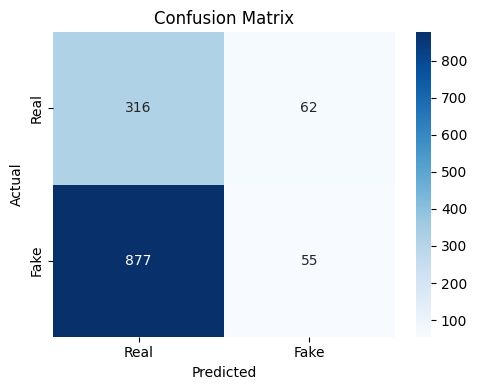

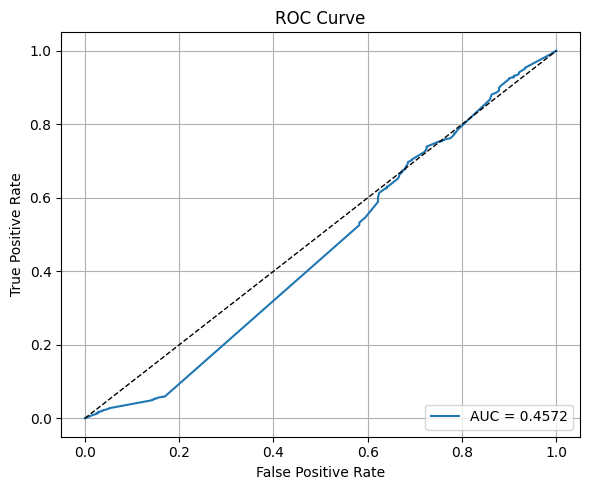

In [ ]:
import json
from sklearn.metrics import (
    confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve
)
import matplotlib.pyplot as plt
import seaborn as sns

# Load results
with open("/content/drive/MyDrive/DeepFake_Detection_Videos/results/results.json", "r", encoding="utf-8") as f:
    results_processed = json.load(f)

# Extract data
y_true = [1 if r["label"] == "fake" else 0 for r in results_processed]
y_pred_str = [r["predicted_label"] for r in results_processed]
y_pred = [1 if label == "fake" else 0 for label in y_pred_str]
y_conf = [r["predicted_confidence"] for r in results_processed]

# Adjust confidence for ROC AUC: probability of "fake"
y_score = [
    conf if pred == "fake" else 1 - conf
    for pred, conf in zip(y_pred_str, y_conf)
]

# Print metrics
print("Accuracy:", accuracy_score(y_true, y_pred))
print("Precision:", precision_score(y_true, y_pred))
print("Recall:", recall_score(y_true, y_pred))
print("F1 Score:", f1_score(y_true, y_pred))
print("ROC AUC:", roc_auc_score(y_true, y_score))

# Confusion Matrix
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(5, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap="Blues", xticklabels=["Real", "Fake"], yticklabels=["Real", "Fake"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.tight_layout()
plt.show()

# ROC Curve
fpr, tpr, _ = roc_curve(y_true, y_score)
plt.figure(figsize=(6, 5))
plt.plot(fpr, tpr, label=f"AUC = {roc_auc_score(y_true, y_score):.4f}")
plt.plot([0, 1], [0, 1], 'k--', lw=1)
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend(loc="lower right")
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
len(results_processed) # Final length of the results

1310

In [ ]:
with open("/content/drive/MyDrive/DeepFake_Detection_Videos/results/logs.json", "r", encoding="utf-8") as f:
    logs_final = json.load(f)

len(logs)

1310